In [1]:
import sys; sys.path += ['..']
from main_analysis import *

from tqdm.auto import tqdm

In [2]:
benchmark, region = 'shared1000_OTC-only', 'OTC'
benchmark = NSDBenchmark(*benchmark.split('_'))
image_paths = benchmark.stimulus_data.image_path

Now loading the shared1000 image set and the OTC-only voxel set...


#### Image Grid

In [3]:
import matplotlib.pyplot as plt
import matplotlib.colors as mplcolors
from matplotlib import image as mpimg

from parula_cmap import parula_cmap

def frame_image(img, frame_width, color = (255, 0, 0)):
    b = frame_width
    ny, nx = img.shape[0], img.shape[1] 
    framed_img = Image.new('RGB', (b+ny+b, b+nx+b), color) 
    framed_img = (np.array(framed_img.getdata())
                  .reshape(framed_img.size[0], framed_img.size[1], 3))
    framed_img[b:-b, b:-b] = img
    return framed_img

def plot_grid(img_paths, rows, cols, figsize=(10, 10), 
              border_size=30, cmap = None, dpi = 100):
    
    plt.rcParams['figure.dpi'] = dpi
    
    fig = plt.figure(figsize=figsize)
    for i, img_path in enumerate(tqdm(img_paths)):
        if cmap is None:
            color = (255, 0, 0)
        if cmap is not None:
            color = tuple((cmap[i][:-1] * 255).astype(int))
        ax = fig.add_subplot(rows, cols, i + 1)
        img = mpimg.imread(img_path)
        framed_img = frame_image(img, border_size, color)
        ax.imshow(framed_img)
        ax.set_axis_off()
        ax.set_frame_on(False)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.grid(False)
        ax.set_aspect('equal')
        ### reduce space between subplots
    fig.subplots_adjust(wspace=0.01, hspace=0.01)
    plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

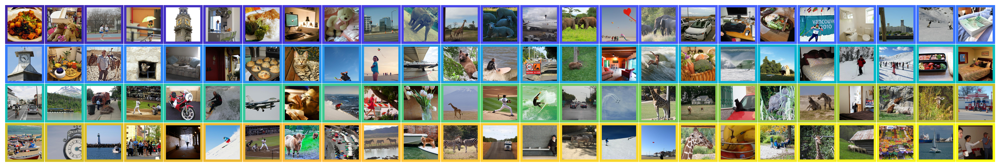

In [4]:
cmap = parula_cmap(np.linspace(0, 1, 100))
cmap = [np.array(mplcolors.to_rgba(c)) for c in cmap]

sub_image_paths = np.array(image_paths)[::10]

plot_grid(sub_image_paths, rows=4, cols=25, figsize=(25, 4), cmap=cmap, dpi=300)